# Read the data and rename some parameters
Ref: He et al., 2011, SIMULATING TRANSIENT CLIMATE EVOLUTION OF THE LAST DEGLACIATION WITH CCSM3

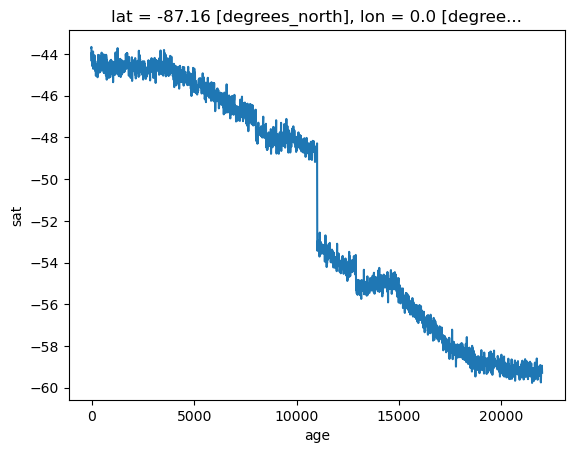

In [1]:
import xarray as xr

# import .nc data
ds = xr.open_dataset('D:\VScode\Last_deglaciation\TraCE_data\TraCE-21K-II.ann.TS.nc')
# ds

ds = ds.rename({'TS': 'sat'})
# rename the time to age
ds = ds.rename({'time': 'age'})
# multiply age by 1000
ds['age'] = ds['age'] * -1000

# convert the sat to degrees C
ds['sat'] = ds['sat'] - 273.15

ds = ds[['sat']]

# plot a record from the ds_sat at given lat and lon
ds['sat'].isel(lat=0, lon=0).plot()

# The age of LGMR data starts from 100 and ends at 23900 with step of 200 yr. The age of TraCE starts from -29 and ends at 22000, so we resample the TraCE data to match the resolution of LGMR

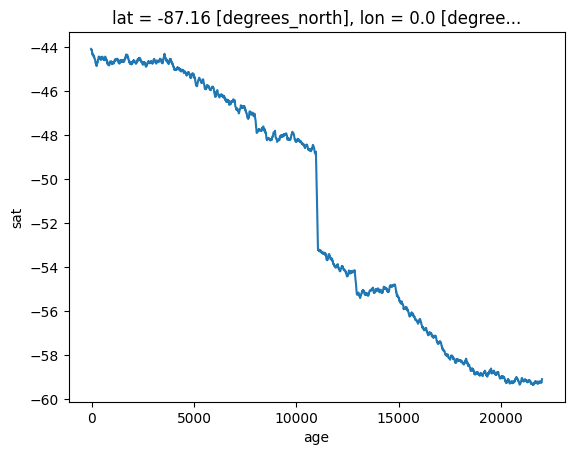

In [26]:
import numpy as np
import xarray as xr

# smoothed_sat = ds['sat'].rolling(age=10, center=True).mean()
smoothed_sat = ds['sat'].rolling(age=10, center=True, min_periods=1).mean()
ds_sat = smoothed_sat.to_dataset(name='sat')
ds_sat['sat'].isel(lat=0, lon=0).plot()

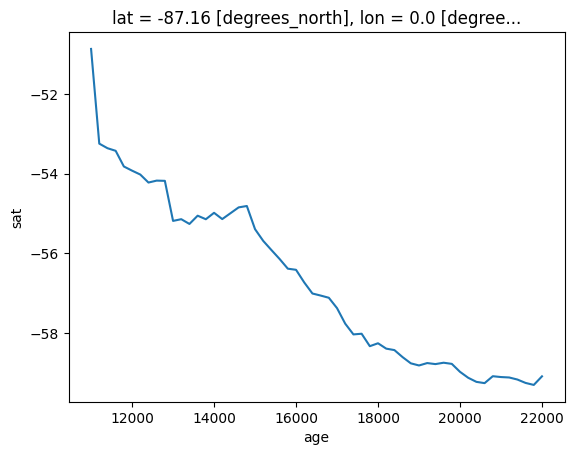

In [28]:
import numpy as np
import xarray as xr

# smoothed_sat = ds['sat'].rolling(age=10, center=True).mean()
smoothed_sat = ds['sat'].rolling(age=10, center=True, min_periods=1).mean()


# Ensure new_age is within the bounds of the original 'age' data
new_age = np.arange(11000, 22001, 200)

# Interpolate the smoothed 'sat' data variable to the new 'age' coordinate
resampled_sat = smoothed_sat.interp(age=new_age)
# resampled_sat=ds['sat'].interp(age=new_age, method='linear')


# Create a new xarray Dataset with the resampled 'sat' data variable
ds_sat = resampled_sat.to_dataset(name='sat')

# ds_sat
# plot a record from the ds_sat at given lat and lon
ds_sat['sat'].isel(lat=0, lon=0).plot()

# Alternative, don't resample data, just crop the data for age>11

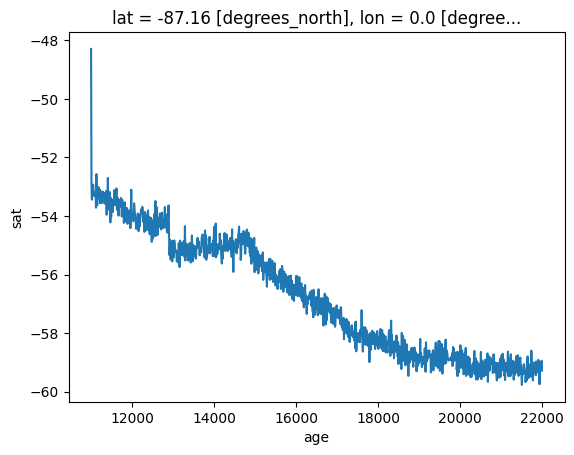

In [2]:
ds_sat=ds
ds_sat = ds_sat.where(ds_sat.age>=11000, drop=True)
ds_sat['sat'].isel(lat=0, lon=0).plot()

In [3]:
ds_sat=ds

# PCA

shape of the weight: (48,)
shape of the reshaped sat_centered_weighted: (2205, 4608)


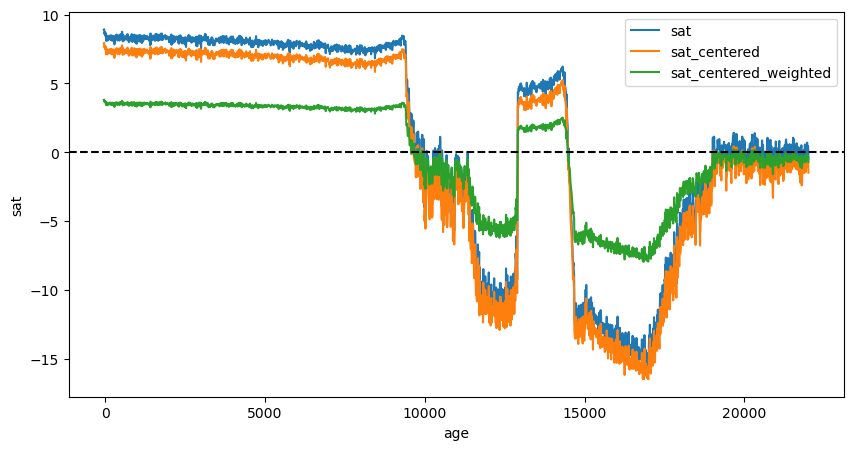

In [4]:
from toolbox import PCA_functions as pf
# 1. Center the Data
ds_sat = pf.center_data(ds_sat)

# 2. Weight the Data
ds_sat = pf.apply_weighting(ds_sat)

# 3. Plot the Centered and Weighted Data
# Assuming you want to plot data for lat=0 and lon=0
lat_index = 40
lon_index = 90
pf.plot_sat_variables(ds_sat, lat_index, lon_index)


In [5]:
from toolbox import PCA_functions as pf
# 4. Perform PCA
exp_variance, eofs, pcs = pf.sat_PCA(ds_sat)
print('Explained variance:', exp_variance)


shape of the reshaped sat_centered_weighted: (4608, 2205)
shape of u, s, vh: (4608, 4608) (2205,) (2205, 2205)
shape of EOFs: (4608, 2)
shape of PCs: (2205, 2)
Explained variance: [8.95606696e-01 6.13897393e-02 1.62052066e-02 ... 9.14635862e-10
 9.08660346e-10 1.48334355e-11]


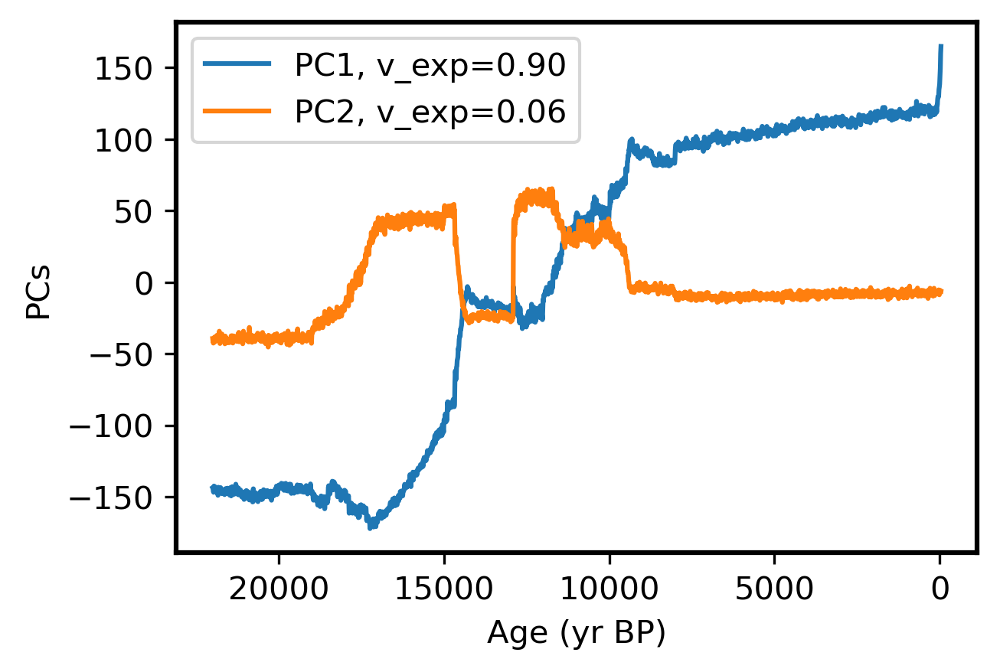

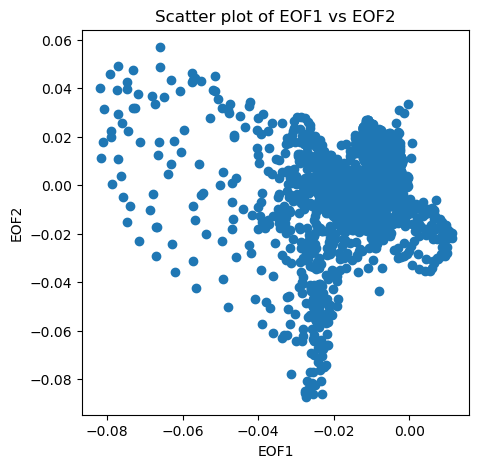

d:\VScode\Last_deglaciation\toolbox\PCA_functions.py:258: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


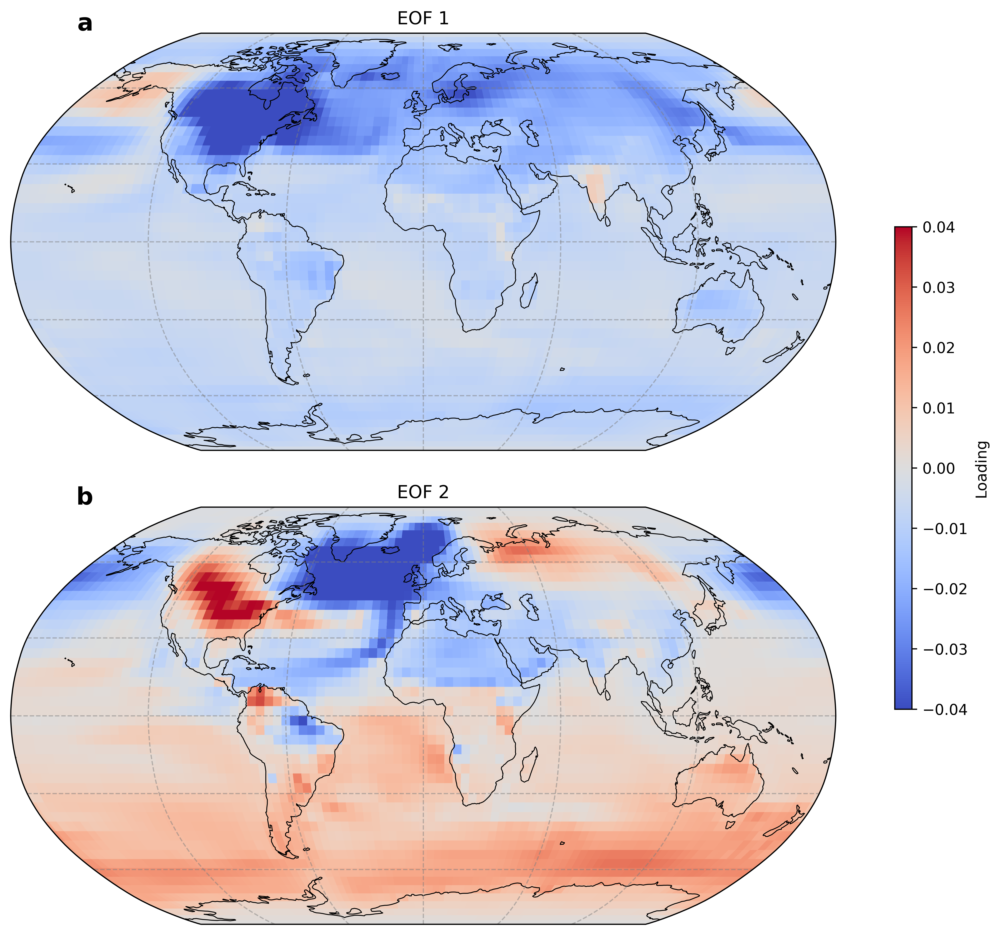

(<Figure size 4800x5400 with 3 Axes>,
 array([<GeoAxes: title={'center': 'EOF 1'}>,
        <GeoAxes: title={'center': 'EOF 2'}>], dtype=object))

In [6]:
# 5. Plot PCs
pf.plot_pcs(ds_sat['age'].values, pcs, exp_variance)

# 6. Plot EOF Scatter
pf.plot_eof_scatter(eofs)

# 7. Plot the EOF Map
pf.plot_eof_map(eofs, ds_sat['lat'].values, ds_sat['lon'].values)

# AIC

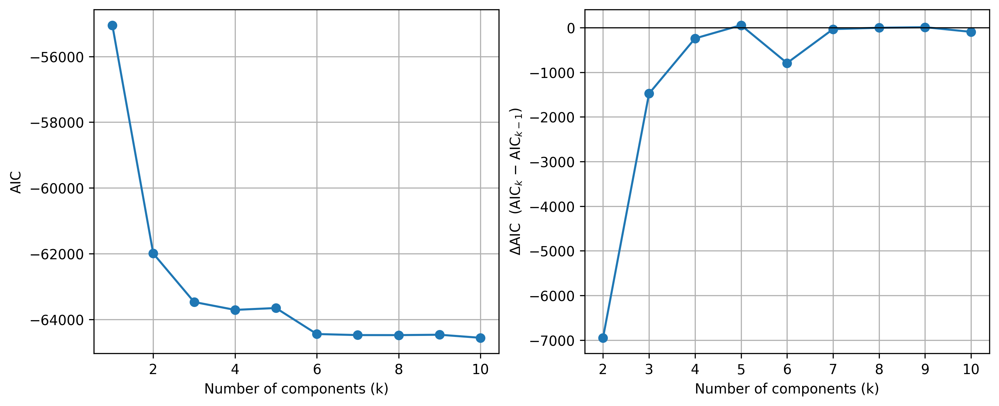

AIC values: [-55047.12346182 -61995.57452356 -63471.83794346 -63711.72742272
 -63654.74041668 -64446.31908645 -64478.36252278 -64479.3132548
 -64467.77400476 -64560.59193693]
ΔAIC values: [-6.94845106e+03 -1.47626342e+03 -2.39889479e+02  5.69870060e+01
 -7.91578670e+02 -3.20434363e+01 -9.50732021e-01  1.15392500e+01
 -9.28179322e+01]


In [16]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf)
import matplotlib.pyplot as plt
import numpy as np


# ── run it on your EOF loadings (or PCs) ──────────────────────────
aic, delta_aic = gf.gmm_aic_curve(eofs, max_components=10, init_params='random')


# ── side-by-side plot ────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=300,
                         constrained_layout=True)

k_vals = np.arange(1, len(aic) + 1)
k_vals_diff = np.arange(2, len(aic) + 1)   # starts at k = 2

# AIC
axes[0].plot(k_vals, aic, marker='o')
axes[0].set_xlabel('Number of components (k)')
axes[0].set_ylabel('AIC')
# axes[0].set_title('GMM AIC')
axes[0].grid(True)

# ΔAIC = AIC(k) − AIC(k−1)
axes[1].plot(k_vals_diff, delta_aic, marker='o')
axes[1].axhline(0, color='k', lw=0.8)      # reference line
axes[1].set_xlabel('Number of components (k)')
axes[1].set_ylabel(r'$\Delta$AIC  (AIC$_k$ − AIC$_{k-1}$)')
# axes[1].set_title('ΔAIC between successive models')
axes[1].grid(True)

plt.show()


# print AIC and ΔAIC values
print("AIC values:", aic)
print("ΔAIC values:", delta_aic)


# GMM

d:\Users\User\anaconda3\envs\pz_venv_causal\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\subprocess.py", line 493, in run
    with Popen(*popenargs, **kwargs) as process:
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\subprocess.py", line 858, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "d:\Users\User\anaconda3\envs\pz_venv_causal\lib\subprocess.py", line 1327, in _execute_child
    hp, ht, pi

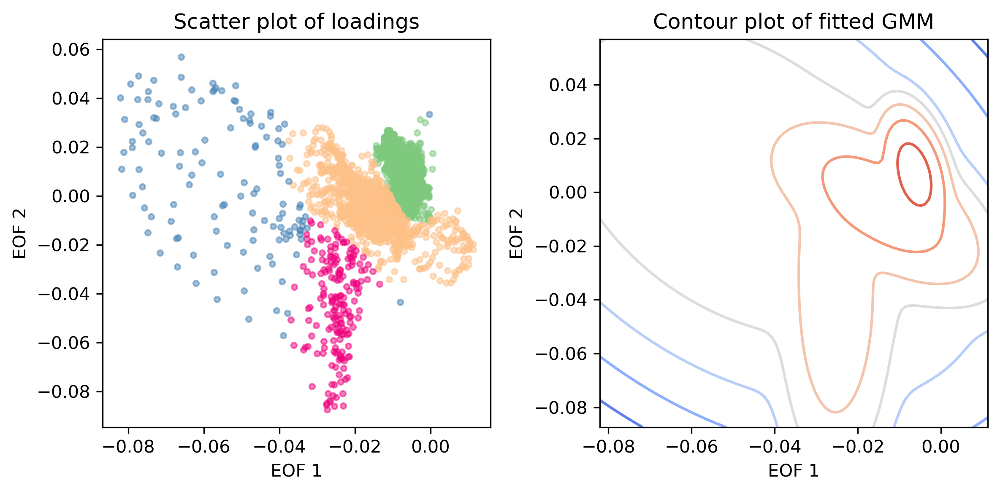

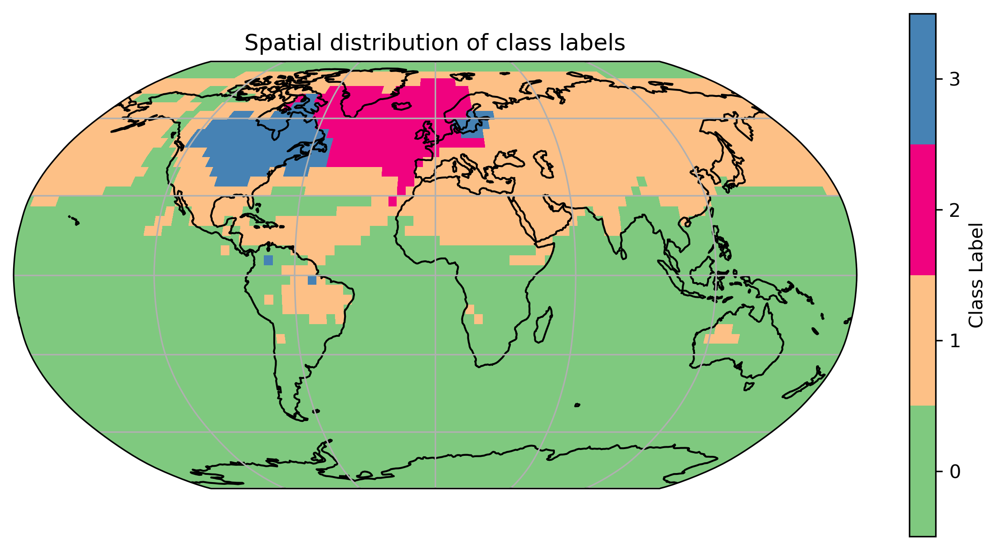

In [7]:
from toolbox import GMM_functions as gf
ds_EOFs_GMM,reshaped_probs=gf.GMM4EOFS(eofs, ds_sat,n_components=4)
gf.plot_labels(ds_EOFs_GMM)

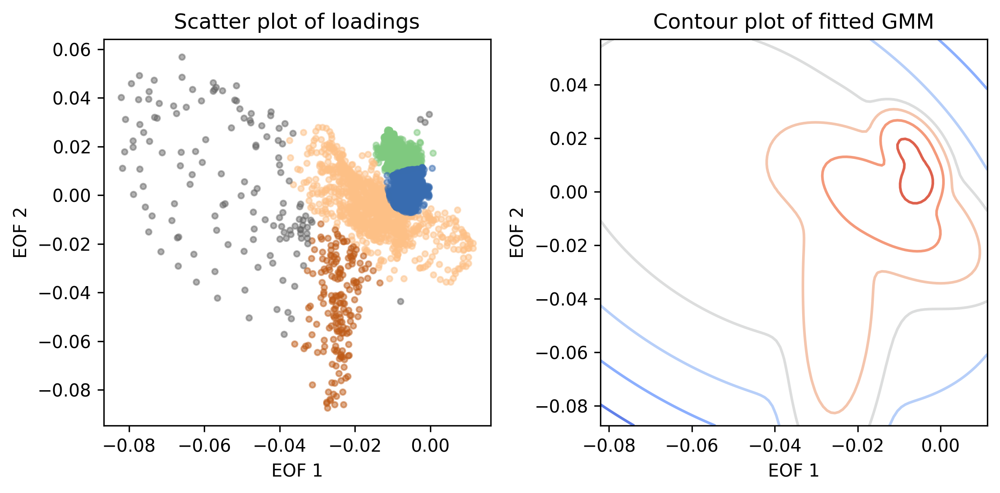

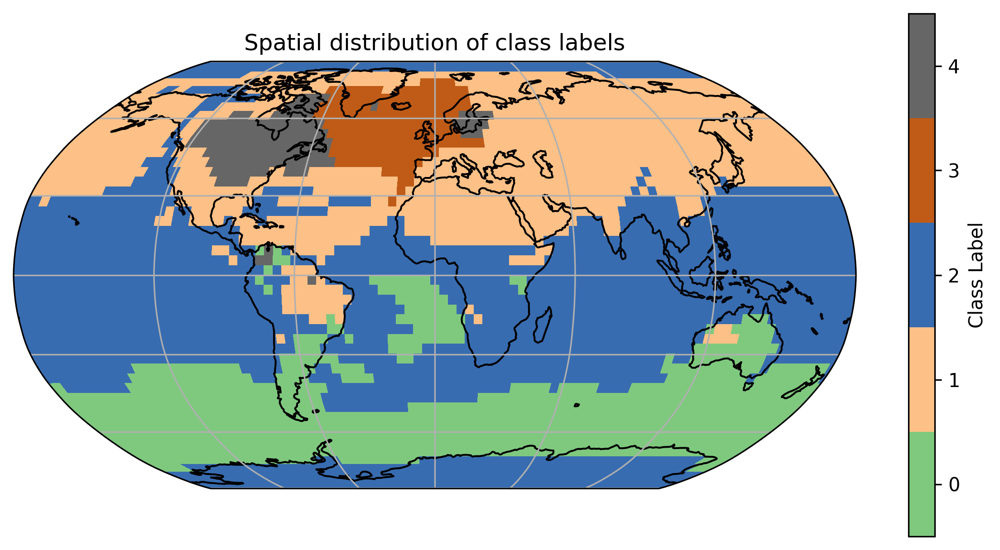

In [18]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf)

ds_EOFs_GMM,reshaped_probs=gf.GMM4EOFS(eofs, ds_sat,n_components=5)
gf.plot_labels(ds_EOFs_GMM)

In [19]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf)

uncor_weighted_avg=gf.plot_weighted_average_curve(ds_EOFs_GMM.copy(), dpi=900)

In [26]:
from toolbox import GMM_functions as gf
import importlib
importlib.reload(gf)

uncor_weighted_avg=gf.plot_weighted_average_curve(ds_EOFs_GMM.copy(), dpi=900)

# 33 for kmeans++; 0 for kmeans;6 for random

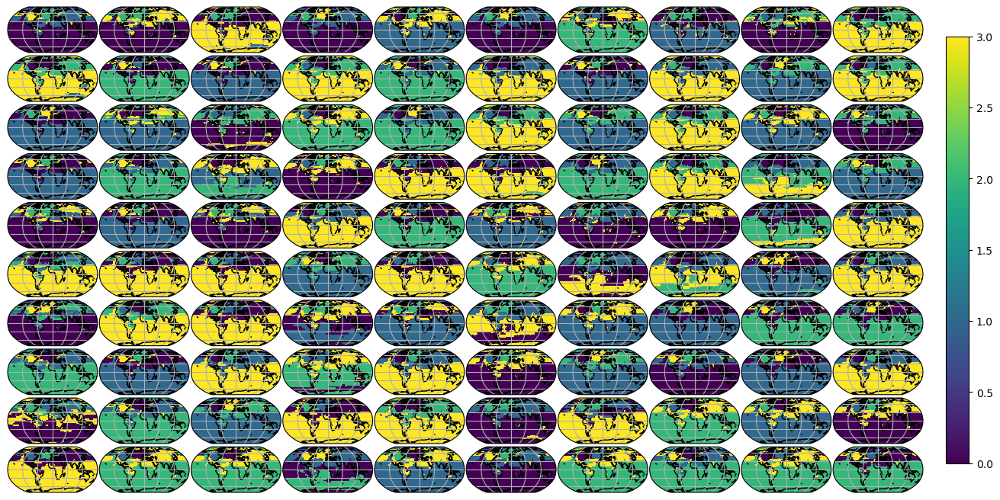

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import ListedColormap

# Define a function to perform GMM and return class labels
def perform_gmm(data, n_components=4, init_params='k-means++'):
    gmm_model = GaussianMixture(n_components=n_components, covariance_type='full', init_params=init_params)
    gmm_model.fit(data)
    class_labels = gmm_model.predict(data)
    return class_labels

# Loop over GMM computation and store results
results = []
n_loops = 100
for i in range(n_loops):
    class_labels = perform_gmm(eofs)  
    results.append(class_labels.reshape(48, 96))  # Reshape if needed based on your data's lat-lon dimensions

# Function to plot results on a map
def plot_class_labels_grids(results, n_rows=10, n_cols=10):
    fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 8),
                            subplot_kw={'projection': ccrs.Robinson()},
                            dpi=100)
    for idx, ax in enumerate(axs.flat):
        if idx < len(results):
            ax.add_feature(cfeature.COASTLINE)
            ax.gridlines()
            im = ax.pcolormesh(ds_sat['lon'], ds_sat['lat'], results[idx],
                               transform=ccrs.PlateCarree(),
                               cmap='viridis')
        else:
            ax.set_visible(False)
        ax.set_global()
    
    # Add a colorbar
    plt.subplots_adjust(bottom=0.1, top=0.9, left=0.05, right=0.85,
                        wspace=0.02, hspace=0.02)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    plt.show()

# Call the plotting function
plot_class_labels_grids(results)
